# 03. User Animelist Dataset

整形済のデータを用いて、詳しい分析を行っていく。

In [1]:
import numpy as np
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import requests
from PIL import Image
from io import BytesIO
import matplotlib as mpl

In [2]:
# グラフ画像保存用パラメータ
mpl.rcParams["figure.dpi"] = 80
mpl.rcParams["savefig.dpi"] = 300
mpl.rcParams["savefig.bbox"] = "tight"
mpl.rcParams["figure.figsize"] = (8, 6)
output_dir = Path("..", "output")

前回作成した、レーティングのデータに、分析に必要なデータを過不足なく加えた`ratings`テーブル。

In [3]:
ratings = pd.read_pickle(Path("..", "data", "processed", "merged.pkl"))

In [4]:
ratings.head()

,userID,animeID,rating,type,year,episodes,sequel
0,1,1,10,MOVIE,2004,1,False
1,1,2,10,TV,2006,37,False
2,1,3,7,TV,2013,10,False
3,1,4,10,TV,2012,12,False
4,1,5,10,TV,2012,25,False


In [5]:
ratings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 148170496 entries, 0 to 148170495
Data columns (total 7 columns):
 #   Column    Dtype   
---  ------    -----   
 0   userID    int32   
 1   animeID   int16   
 2   rating    int8    
 3   type      category
 4   year      Int16   
 5   episodes  int16   
 6   sequel    bool    
dtypes: Int16(1), bool(1), category(1), int16(2), int32(1), int8(1)
memory usage: 1.9 GB


そして、個々のアニメのタイトルやジャンル、ビジュアルなどの情報を参照するために別途用意する`animes`テーブル。

In [6]:
animes = pd.read_pickle(Path("..", "data", "processed", "animes.pkl"))

In [7]:
animes.head(3)

,animeID,title,alternative_title,score,episodes,image_url,genres,genres_detailed
0,1,Howl's Moving Castle,Howl no Ugoku Shiro,8.41,1,https://cdn.myanimelist.net/images/anime/1470/...,"['Adventure', 'Award Winning', 'Drama', 'Fanta...","['action', 'adventure', 'age gap', 'air force'..."
1,2,Death Note,NaN,8.63,37,https://cdn.myanimelist.net/images/anime/1079/...,"['Supernatural', 'Suspense']","['achronological order', 'acting', 'adapted in..."
2,3,Problem Children Are Coming from Another World...,Mondaiji-tachi ga Isekai kara Kuru Sou desu yo?,7.42,10,https://cdn.myanimelist.net/images/anime/12/43...,"['Action', 'Comedy', 'Fantasy']","['action', 'alternative world', 'anthropomorph..."


In [8]:
animes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20237 entries, 0 to 20236
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   animeID            20237 non-null  int16  
 1   title              20237 non-null  object 
 2   alternative_title  8676 non-null   object 
 3   score              19644 non-null  float32
 4   episodes           20237 non-null  int16  
 5   image_url          20237 non-null  object 
 6   genres             20237 non-null  object 
 7   genres_detailed    20237 non-null  object 
dtypes: float32(1), int16(2), object(5)
memory usage: 948.7+ KB


それから、`ratings`データセットの`"animeID"`から、アニメのタイトルを参照できる関数を定義しておきたい

In [9]:
def anime_title(animeID):
    return animes[animes["animeID"] == animeID]

In [10]:
anime_title(1)

,animeID,title,alternative_title,score,episodes,image_url,genres,genres_detailed
0,1,Howl's Moving Castle,Howl no Ugoku Shiro,8.41,1,https://cdn.myanimelist.net/images/anime/1470/...,"['Adventure', 'Award Winning', 'Drama', 'Fanta...","['action', 'adventure', 'age gap', 'air force'..."


さらに、データのビジュアルを一気に表示する関数をあらかじめ定義しておく。

In [11]:
def show_image(df):
    for index, row in df.iterrows():
        print(row["title"])

        try:
            url = row["image_url"]
            response = requests.get(url)
            img = Image.open(BytesIO(response.content))
    
            plt.imshow(img)
            plt.axis("off")
            plt.show()

        except Exception as e:
            print(e)

## 分析
分析の手掛かりとなる、主なデータの成分は以下の通り。
- 個々のレーティング値
- アニメの放送形式
- アニメがリリースされた年
- 総エピソード数
- 続編か否か？

### リリースされた年代による評価の平均と件数
まずは、アニメの年代によって評価の平均は変わるのか見ていきたい。

In [12]:
ratings["year"].min()

np.int16(1907)

In [13]:
ratings["year"].max()

np.int16(2027)

この分析は2025年8月に行っているが、データには2027年の作品のデータが含まれている事が判明した。

In [14]:
ratings[ratings["year"] == 2027]

,userID,animeID,rating,type,year,episodes,sequel
37138292,739124,16193,10,SPECIAL,2027,12,False
53897778,874928,16193,8,SPECIAL,2027,12,False
64881275,964310,16193,10,SPECIAL,2027,12,False


In [15]:
anime_title(16193)

,animeID,title,alternative_title,score,episodes,image_url,genres,genres_detailed
16192,16193,Ghost of Tsushima: Legends,NaN,NaN,12,https://cdn.myanimelist.net/images/anime/1964/...,"['Action', 'Mystery', 'Supernatural']","['action', 'adventure', 'assassins', 'based on..."


Ghost of Tsushima: Legends


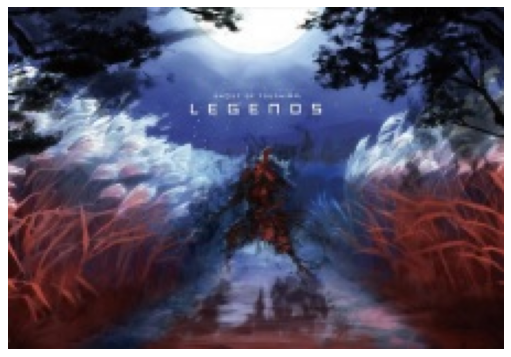

In [16]:
show_image(anime_title(16193))

分析の都合上、今回は未公開作品のデータも削除せずに、そのまま残しておこうと思う。

`pd.cut`関数によって、時系列を複数のビンで分割する。分割の仕方は、等間隔に12に分け、データを割り振っている。

In [17]:
year_cut = pd.cut(ratings["year"], 12)

In [18]:
# データを分割するためのカテゴリのシリーズ
year_cut

0            (1997.0, 2007.0]
1            (1997.0, 2007.0]
2            (2007.0, 2017.0]
3            (2007.0, 2017.0]
4            (2007.0, 2017.0]
                   ...       
148170491    (1997.0, 2007.0]
148170492    (1997.0, 2007.0]
148170493    (2007.0, 2017.0]
148170494    (2007.0, 2017.0]
148170495    (1997.0, 2007.0]
Name: year, Length: 148170496, dtype: category
Categories (12, interval[float64, right]): [(1906.88, 1917.0] < (1917.0, 1927.0] < (1927.0, 1937.0] < (1937.0, 1947.0] ... (1987.0, 1997.0] < (1997.0, 2007.0] < (2007.0, 2017.0] < (2017.0, 2027.0]]

In [19]:
# year_cutでグループ分けしたオブジェクト
era = ratings.groupby(year_cut, observed=True)

#### 年代ごとの、評価の平均

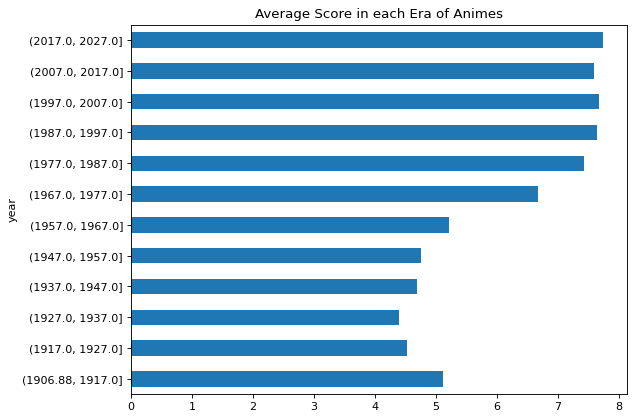

In [20]:
era["rating"].mean().plot(kind="barh", title="Average Score in each Era of Animes")
plt.savefig(output_dir / "05_Average_Score_in_each_Era_of_Animes.png")
plt.show()

近年に作られたアニメの方が、昔のアニメより高いレーティングがつく傾向にあるようだ。

#### 年代ごとの、評価の件数
では、投稿された評価の件数はどうだろうか

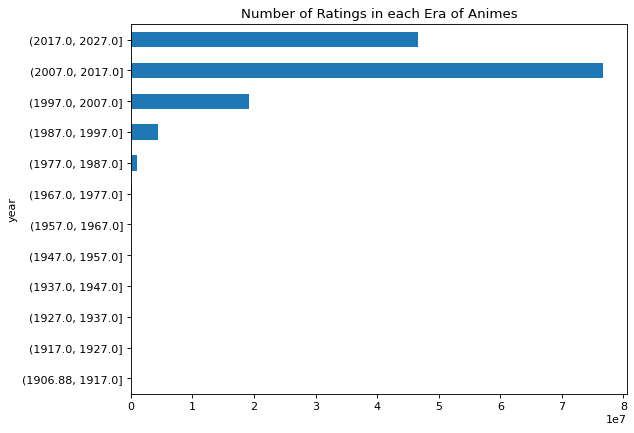

In [21]:
era["rating"].size().plot(kind="barh", title="Number of Ratings in each Era of Animes")
plt.savefig(output_dir / "06_Number of Ratings in each Era of Animes.png")
plt.show()

あくまで該当するサイトにおいてのみ言える事だが、年代によってサンプル数それ自体に大きな偏りがある。<br>
2007~2017年代が、最もレーティングサイトが盛り上がっていた時期である事が分かる。

### アニメの放送形式による評価の違い
これもちょっと見てみたいと思う。

In [22]:
# 放送形式でグループ化したオブジェクトを先に作る
anime_type = ratings.groupby("type", observed=True)

タイプによる評価点のおおざっぱなばらつきは見られない。

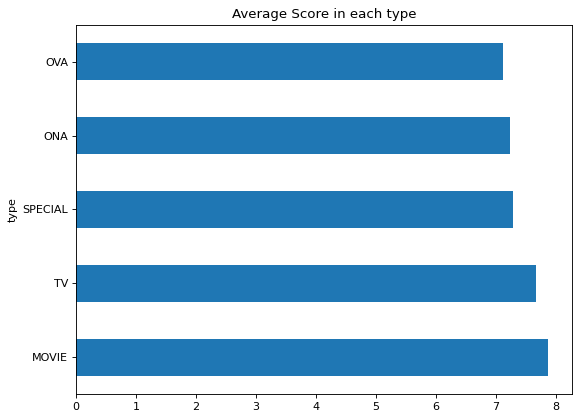

In [23]:
anime_type["rating"].mean().sort_values(
    ascending=False
).plot(kind="barh", title="Average Score in each type")
plt.savefig(output_dir / "07_Average Score in each type.png")
plt.show()

ただ、付いている評価の**件数**に関してはテレビ放送形式のものが突出して多い。<br>
1ページ目で見た通り、タイトルの数自体はアニメの放送形式によってそこまで大きな開きがあるわけではない。<br>
だが、やはりTV放送形式によるアニメ作品が、ファンにとって最も身近で一般的なものである事が以下のグラフから分かる。

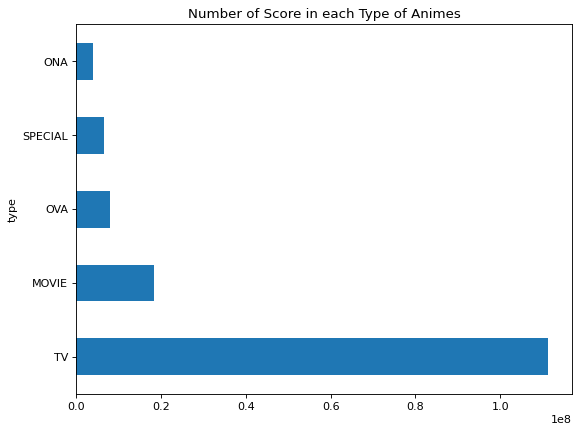

In [24]:
anime_type["rating"].size().sort_values(
    ascending=False
).plot(kind="barh", title="Number of Score in each Type of Animes")
plt.savefig(output_dir / "08_Number of Score in each Type of Animes.png")
plt.show()

### エピソード数の多いタイトル
ところで、アニメのタイトルには一部とんでもなくエピソード数が多いタイトルが存在する。<br>
上位20個ほど抽出して、そのタイトルを調べてみたいと思う。

In [25]:
large_episode = animes.sort_values(
    "episodes", ascending=False
).head(20)

In [26]:
large_episode["episodes"]

14538    3057
5830     2805
6053     2527
9325     1818
19102    1800
1552     1787
12800    1768
6545     1717
11761    1696
9590     1565
5968     1483
10581    1471
14533    1428
14551    1306
1412     1287
17085    1274
1482     1164
217      1132
13664    1006
5121      837
Name: episodes, dtype: int16

エピソード数4桁のタイトルが19もあるとは驚きである。きっと私も知っているようなメジャーなタイトルに違いない。

では、アニメのビジュアルを表示する関数を用いて、エピソード数が多いアニメのタイトルのビジュアルを一気に見ていこう。

3000 Whys Of Blue Cat


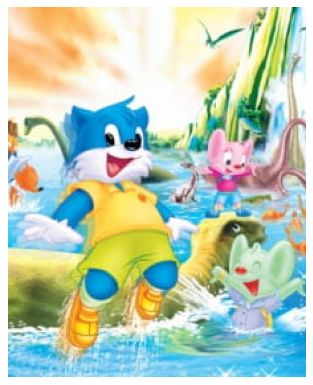

Mrs. Sazae


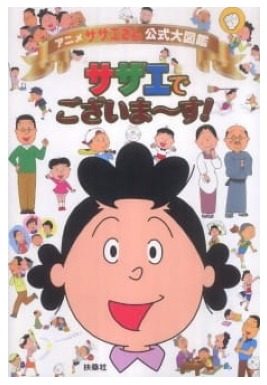

Nintama Rantarou


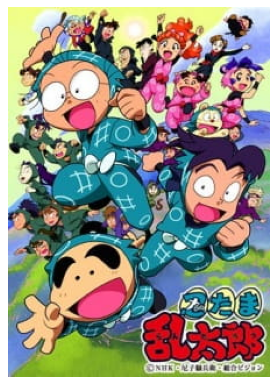

Oyako Club


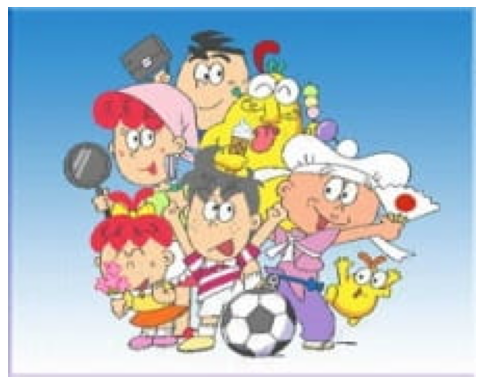

Kamiusagi Rope: Warau Asa ni wa Fukuraitaru tte Maji ssuka!?


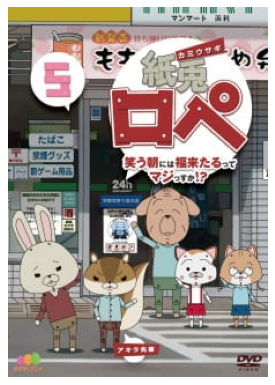

Doraemon


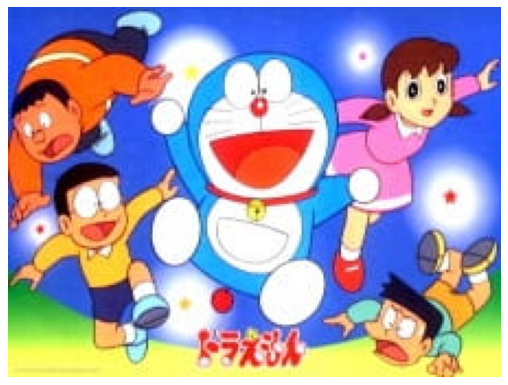

Prince Mackaroo


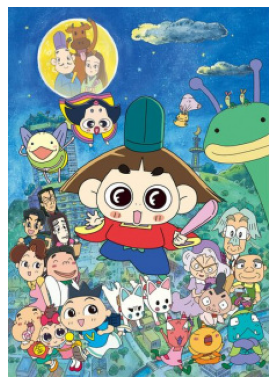

The Lazy Egg


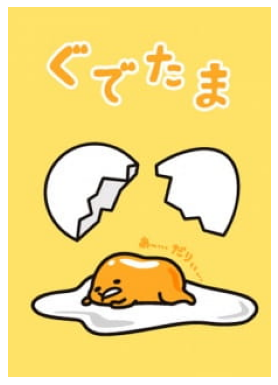

Sore Ike! Anpanman


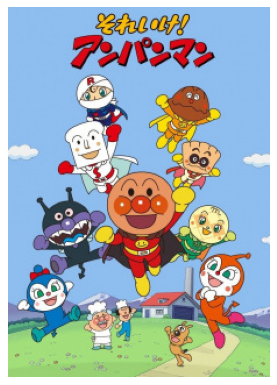

Kirin Monoshiri Yakata


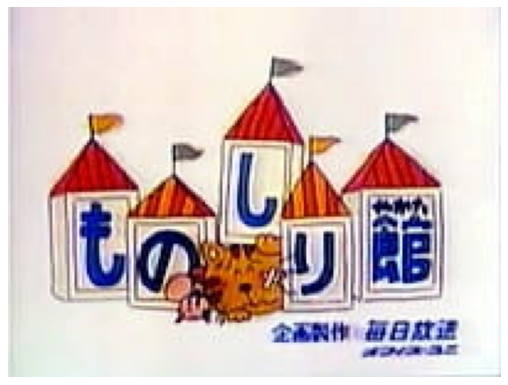

Little Miss Maruko


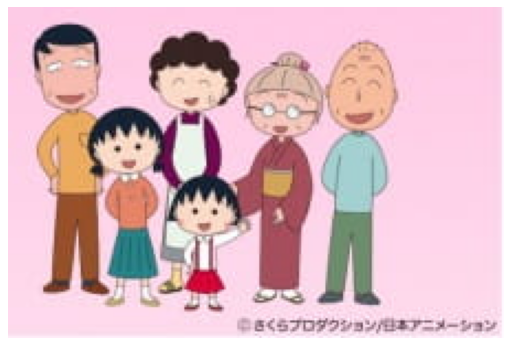

Manga Nippon Mukashibanashi (1976)


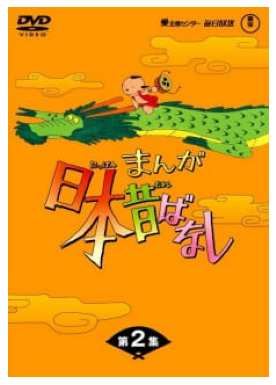

The Affectuous Family


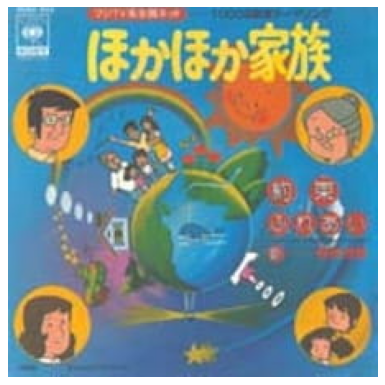

Kirin Ashita no Calendar


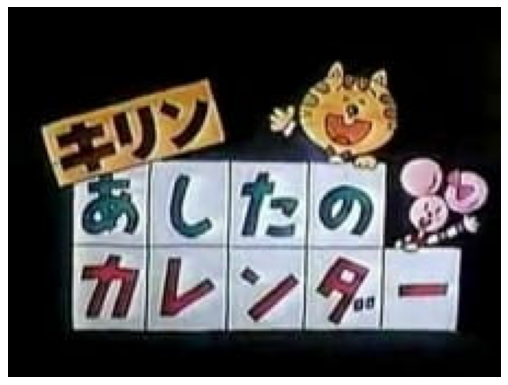

Shin Chan


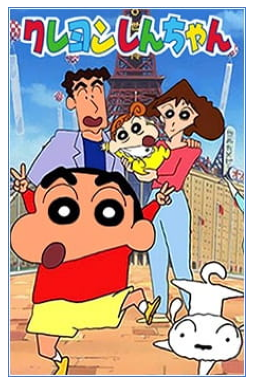

Monoshiri Daigaku: Ashita no Calendar


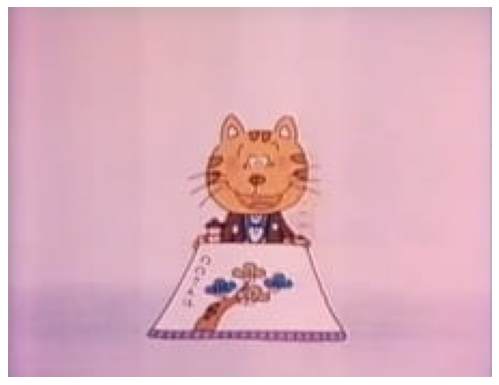

Case Closed


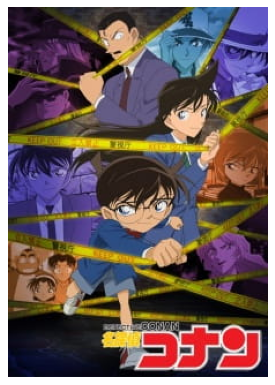

One Piece


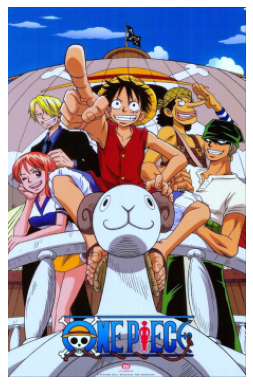

Sekai Monoshiri Ryoko


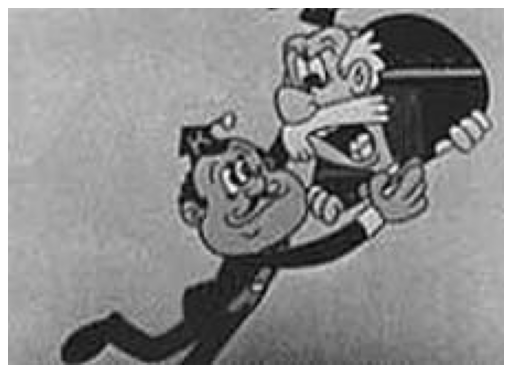

Doraemon (2005)


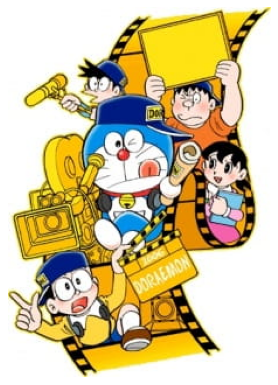

In [27]:
show_image(large_episode)

分析者が知らない作品も一部見受けられた。<br>
では、エピソード数とスコアの平均に相関がないか見ておこう。

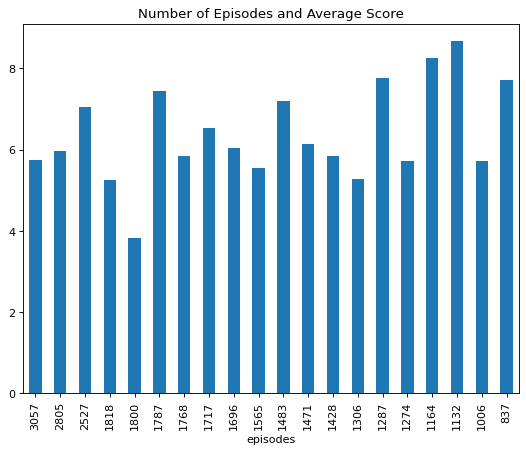

In [28]:
large_episode.plot(
    kind="bar", x="episodes", y="score", legend=False,
    title="Number of Episodes and Average Score"
)
plt.savefig(output_dir / "09_Number of Episodes and Average Score.png")
plt.show()

In [29]:
large_episode[["episodes", "score"]].corr()

,episodes,score
episodes,1.000000,-0.296816
score,-0.296816,1.000000


エピソード数と平均スコアの間にはわずかながら負の相関がみられる。<br>
これが意味するところは、アニメは数を作れば良いというものではなく、その内容、質が問われるのではないかという事である。

### 平均スコアが高いタイトル
では、次は平均スコアが高いタイトルを直に抽出してみたいと思う。

In [30]:
large_score = animes.sort_values(
    ascending=False, by="score"
).head(20)

In [31]:
large_score.iloc[3]

animeID                                                           9056
title                        Tensei shitara Slime Datta Ken 4th Season
alternative_title                                                  NaN
score                                                             10.0
episodes                                                             1
image_url            https://cdn.myanimelist.net/images/anime/1699/...
genres                                 ['Action', 'Comedy', 'Fantasy']
genres_detailed      ['action', 'adventure', 'agender', 'alternativ...
Name: 9055, dtype: object

In [32]:
large_score["score"]

8434     10.0
8021     10.0
13973    10.0
9055     10.0
12769    10.0
12869    10.0
12784    10.0
11390    10.0
9895     10.0
12615    10.0
16255    10.0
16423    10.0
16440    10.0
16456    10.0
15805    10.0
15892    10.0
15893    10.0
13454    10.0
13453    10.0
12777     9.9
Name: score, dtype: float32

上位19件が10点満点だ。これはかなりラインナップに期待できそうである。

Omniscient Reader


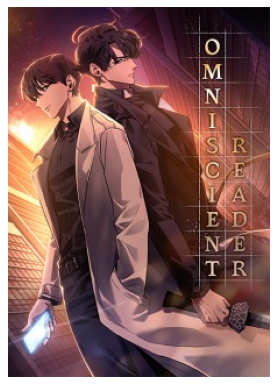

Fire Force Season 3 Part 2
cannot identify image file <_io.BytesIO object at 0x000002C6945813A0>
MF Ghost 3rd Season


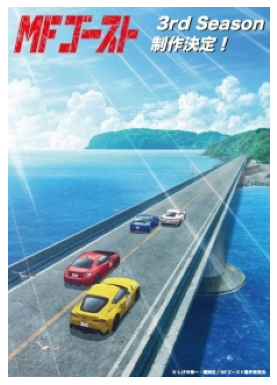

Tensei shitara Slime Datta Ken 4th Season


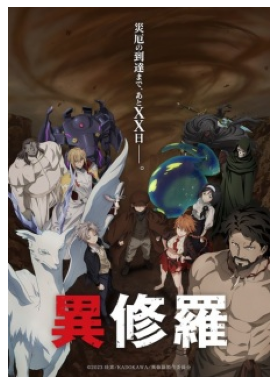

Boku no Kokoro no Yabai Yatsu Movie


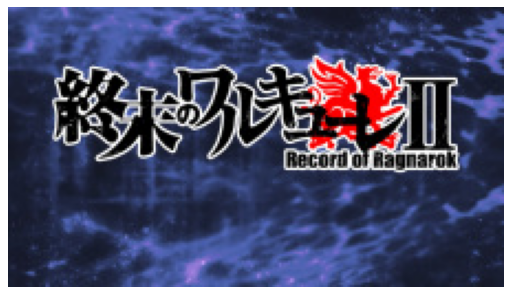

Campfire Cooking in Another World with My Absurd Skill Season 2


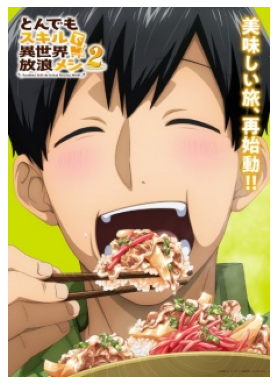

Yozakura-san Chi no Daisakusen 2nd Season


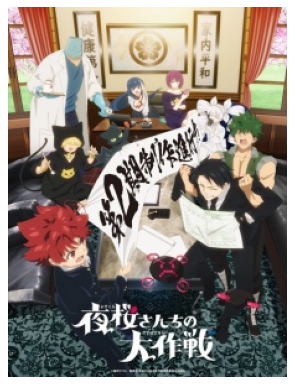

Disney: Twisted-Wonderland The Animation - Episode of Heartslabyul


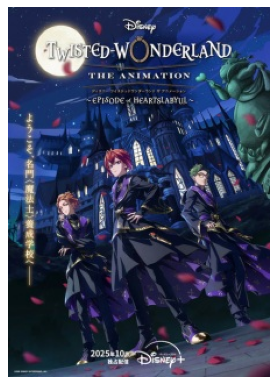

Youkoso Jitsuryoku Shijou Shugi no Kyoushitsu e 4th Season: 2-nensei-hen 1 Gakki


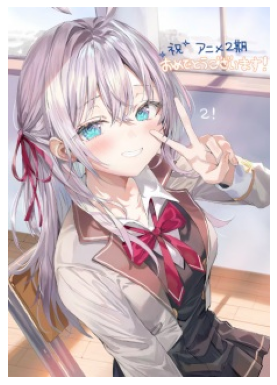

Grand Blue Dreaming Season 2


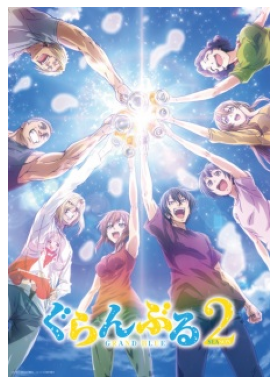

Nige Jouzu no Wakagimi 2nd Season


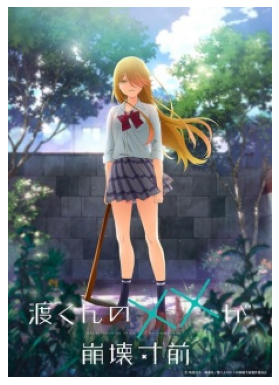

Tokyo Revengers: Santen Sensou-hen


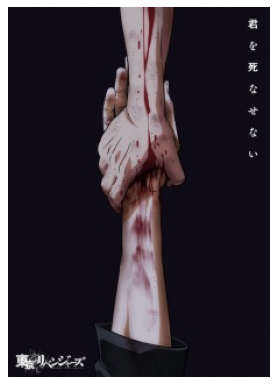

Shangri-La Frontier Season 3


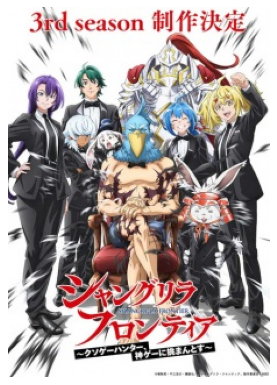

Medalist 2nd Season


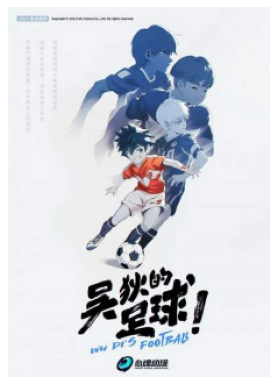

The One Piece


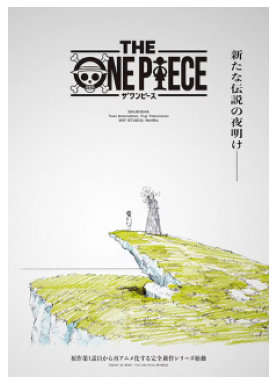

Kakuriyo: Bed and Breakfast for Spirits Season 2


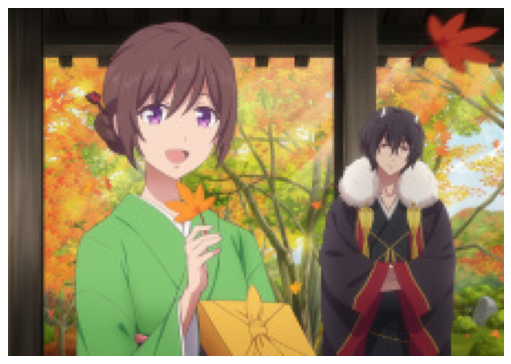

May I Ask for One Final Thing?


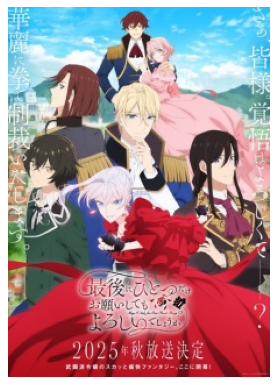

Nageki no Bourei wa Intai shitai Part 2


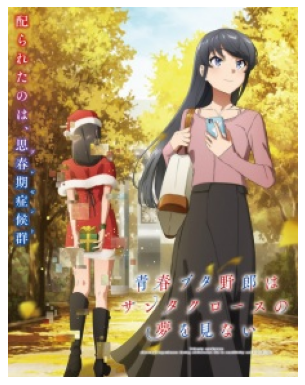

Seishun Buta Yarou wa Santa Claus no Yume wo Minai


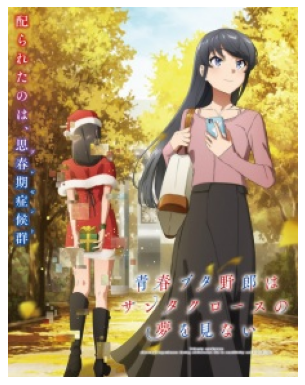

The Irregular at Magic High School The Movie: Yotsuba Succession Arc


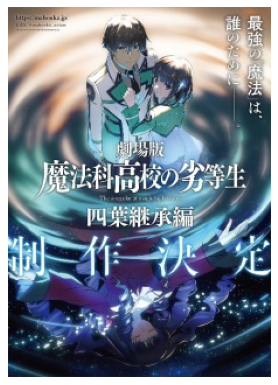

In [33]:
show_image(large_score)

実際に確認したところ、あくまで分析者にとってだが、いわゆるメジャーな作品と言えるものがほどんど存在しなかった。<br>
これは、評価平均が高いと言っても、そもそもその作品を評価した人があまり多くない・つまり、あまり話題になった作品ではないのかもしれない。<br>
そこで、上記の20作品の、評価の件数を調べてみようと思う。

In [34]:
# large_scoreテーブルの"animeID"をisinメソッドに渡して、真偽値マスクを使用してratingsテーブルから該当するデータを抽出している。
large_score_ratings = ratings[ratings["animeID"].isin(large_score["animeID"])]

In [35]:
large_score_ratings.head()

,userID,animeID,rating,type,year,episodes,sequel
29763543,677906,8022,10,TV,2026,1,True
29800248,678321,8435,10,TV,<NA>,1,False
29849602,678808,9056,9,TV,<NA>,1,True
29970578,679959,9896,1,TV,<NA>,12,True
29996282,680168,8435,10,TV,<NA>,1,False


In [36]:
# 平均スコアが高い作品の、評価データの件数を集計
lg_sc_size = large_score_ratings.groupby("animeID")["userID"].size().loc[large_score["animeID"]]

In [37]:
# 件数とその作品のタイトル情報を含んだデータフレームを作成
lg_sc_size = pd.DataFrame({
    "title": large_score.set_index("animeID")["title"],
    "number_of_ratings": lg_sc_size
})

In [38]:
lg_sc_size

,title,number_of_ratings
animeID,,
8435,Omniscient Reader,148
8022,Fire Force Season 3 Part 2,61
13974,MF Ghost 3rd Season,22
9056,Tensei shitara Slime Datta Ken 4th Season,100
12770,Boku no Kokoro no Yabai Yatsu Movie,50
12870,Campfire Cooking in Another World with My Absu...,42
12785,Yozakura-san Chi no Daisakusen 2nd Season,28
11391,Disney: Twisted-Wonderland The Animation - Epi...,25
9896,Youkoso Jitsuryoku Shijou Shugi no Kyoushitsu ...,78


このような結果になった。<br>
では、先ほどののエピソード数が多いアニメの評価件数も確認してみる。

In [39]:
large_episode_ratings = ratings[ratings["animeID"].isin(large_episode["animeID"])]

In [40]:
lg_ep_size = large_episode_ratings.groupby("animeID")["userID"].size().loc[large_episode["animeID"]]

In [41]:
lg_ep_size = pd.DataFrame({
    "title": large_episode.set_index("animeID")["title"],
    "number_of_ratings": lg_ep_size
})

In [42]:
lg_ep_size

,title,number_of_ratings
animeID,,
14539,3000 Whys Of Blue Cat,70
5831,Mrs. Sazae,466
6054,Nintama Rantarou,646
9326,Oyako Club,95
19103,Kamiusagi Rope: Warau Asa ni wa Fukuraitaru tt...,2
1553,Doraemon,8933
12801,Prince Mackaroo,128
6546,The Lazy Egg,693
11762,Sore Ike! Anpanman,268


やはり。評価の平均点こそ劣ってはいるものの、評価の件数という点において差は歴然である。<br>
これは、**平均点**という一側面だけを見て評価をすると誤解してしまう恐れがあるという教訓である。

「評価平均の高い作品」と「エピソード数の多い作品」の、評価件数の合計値の差を可視化すると、圧倒的な開きがある事が分かる。

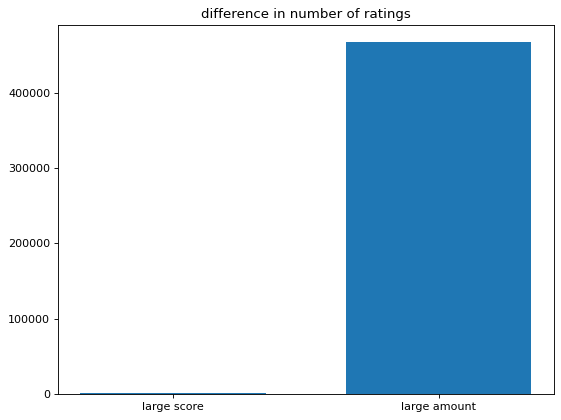

In [43]:
lg_sc_sum = lg_sc_size["number_of_ratings"].sum()
lg_ep_sum = lg_ep_size["number_of_ratings"].sum()

plt.bar(["large score", "large amount"], [lg_sc_sum, lg_ep_sum], width=0.7)
plt.title("difference in number of ratings")
plt.savefig(output_dir / "10_difference in number of ratings.png")
plt.show()

つまり、本当の意味で世間で話題になった・評判になった・流行になったアニメ作品というのは、必ずしも評価の**平均点**が高い作品ではなく、評価の**件数**が多い作品のことであるといえるのではないだろうか。なぜなら、ごく少数の人が観て高評価に偏った作品よりも、より多くの人にレーティングされた作品の方が、それだけ多くの人に観られたという事であり、受け取り方の違いから様々な点数が投稿されたことから、活発な議論を呼んだ作品であると言えるからである。

### 評価件数が多かった作品
では、次は当然、評価件数が最も多かった作品の上位20件を確認したくなるだろう。

In [44]:
# 評価件数で集約し、上位20件の合計件数と、animeIDを抽出する
large_size = ratings.groupby("animeID")["userID"].size().sort_values(
    ascending=False
).iloc[:20]

In [45]:
# 後で結合した時のために、name属性を変更しておく
large_size.name = "number_of_ratings"

In [46]:
large_size

animeID
20      956713
2       854856
100     805993
92      772788
2376    729146
1167    709352
1147    653709
99      634072
1160    625588
1186    623081
726     622877
1154    592853
2977    552694
2384    545325
5       534853
3034    519024
2509    492693
36      487374
1106    478441
6       466882
Name: number_of_ratings, dtype: int64

In [47]:
# 上のシリーズに、アニメのタイトルとイメージurl情報を付与したい
title_image = animes[animes["animeID"].isin(large_size.index)].set_index("animeID")[["title", "image_url"]]
title_image.head()

,title,image_url
animeID,,
2,Death Note,https://cdn.myanimelist.net/images/anime/1079/...
5,Sword Art Online,https://cdn.myanimelist.net/images/anime/11/39...
6,Spirited Away,https://cdn.myanimelist.net/images/anime/6/795...
20,Attack on Titan,https://cdn.myanimelist.net/images/anime/10/47...
36,Naruto,https://cdn.myanimelist.net/images/anime/1141/...


In [48]:
lg_sz_size = pd.merge(
    title_image, large_size, on="animeID"
)

In [49]:
lg_sz_size = lg_sz_size.sort_values(
    by="number_of_ratings", ascending=False
)

In [50]:
lg_sz_size

,title,image_url,number_of_ratings
animeID,,,
20,Attack on Titan,https://cdn.myanimelist.net/images/anime/10/47...,956713
2,Death Note,https://cdn.myanimelist.net/images/anime/1079/...,854856
100,My Hero Academia,https://cdn.myanimelist.net/images/anime/10/78...,805993
92,One Punch Man,https://cdn.myanimelist.net/images/anime/12/76...,772788
2376,Demon Slayer: Kimetsu no Yaiba,https://cdn.myanimelist.net/images/anime/1286/...,729146
1167,My Hero Academia Season 2,https://cdn.myanimelist.net/images/anime/12/85...,709352
1147,Your Name.,https://cdn.myanimelist.net/images/anime/5/870...,653709
99,Fullmetal Alchemist: Brotherhood,https://cdn.myanimelist.net/images/anime/1208/...,634072
1160,Attack on Titan Season 2,https://cdn.myanimelist.net/images/anime/4/841...,625588


Attack on Titan


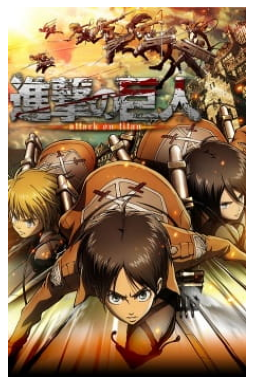

Death Note


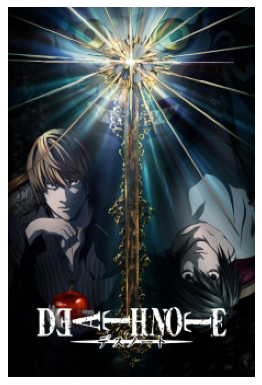

My Hero Academia


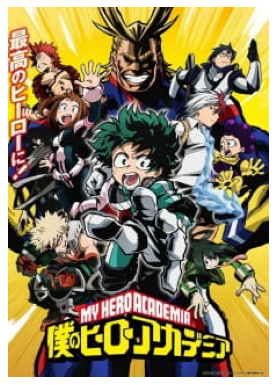

One Punch Man


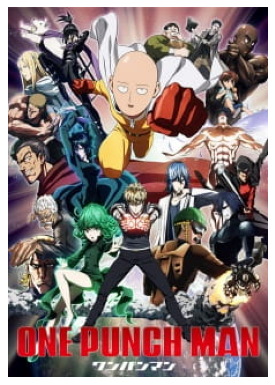

Demon Slayer: Kimetsu no Yaiba


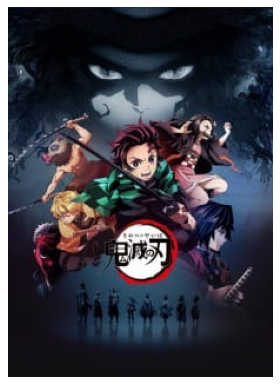

My Hero Academia Season 2


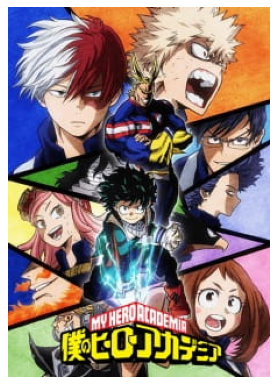

Your Name.


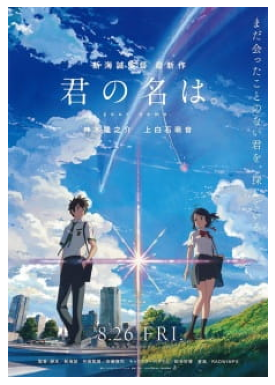

Fullmetal Alchemist: Brotherhood


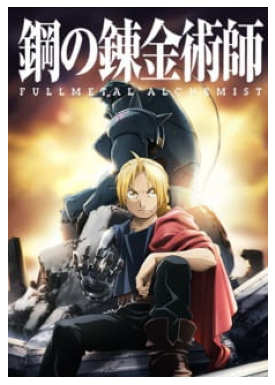

Attack on Titan Season 2


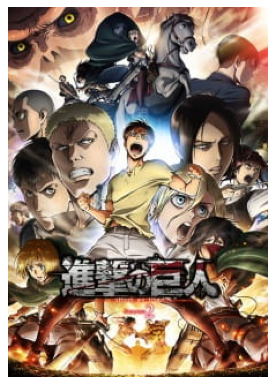

My Hero Academia Season 3


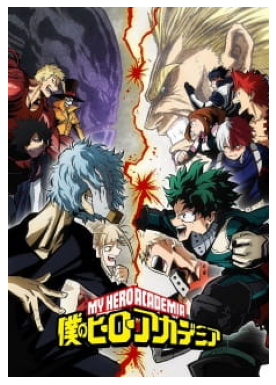

Hunter x Hunter


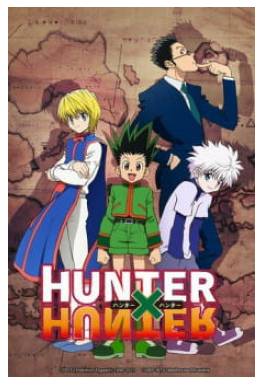

A Silent Voice


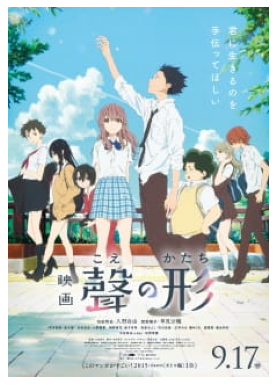

Attack on Titan Season 3


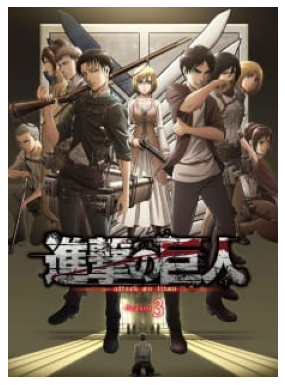

Jujutsu Kaisen


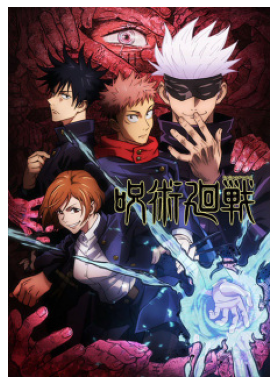

Sword Art Online


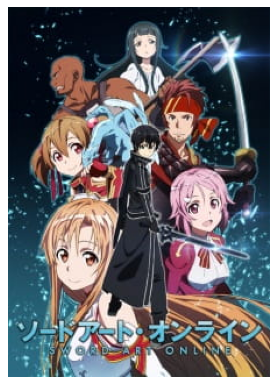

Attack on Titan Season 3 Part 2


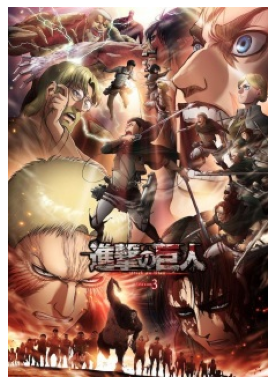

The Seven Deadly Sins


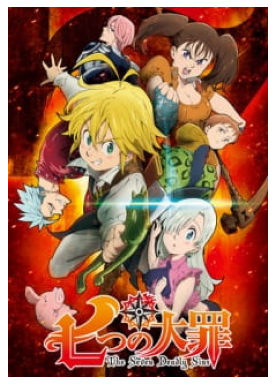

Naruto


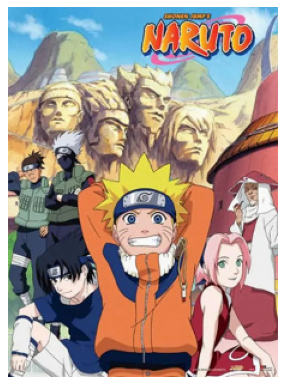

Tokyo Ghoul


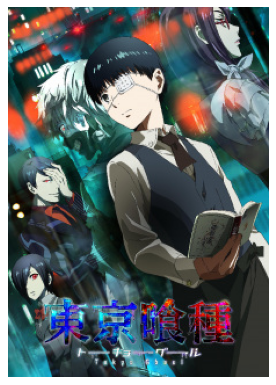

Spirited Away


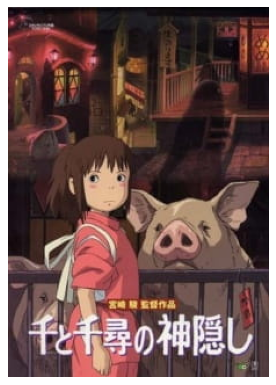

In [51]:
show_image(lg_sz_size)

これなら、日本のアニメを牽引する超名作であると納得できる内容である。

### 続編
最後に、続編であることによって、評価の平均や件数が優位に変わるのか調べてみたい。

In [52]:
group_sequel = ratings.groupby("sequel")

In [53]:
sequel_agg = group_sequel["rating"].agg(["mean", "size"])

In [54]:
sequel_agg = sequel_agg.rename(
    {"mean": "average_of_score", "size": "number_of_score"},
    axis="columns"
)

In [55]:
sequel_agg

,average_of_score,number_of_score
sequel,,
False,7.580068,123946996
True,7.978015,24223500


続編よりも、そうでない場合の方が、評価の件数に大きな違いがある。<br>
やはりどうしても、無印の方が注目度が高いのである。<br>
逆に、続編になっても注目を集め続けられる作品は良い作品であると言える。

無印か続編かによる、評価件数の違いを可視化する。

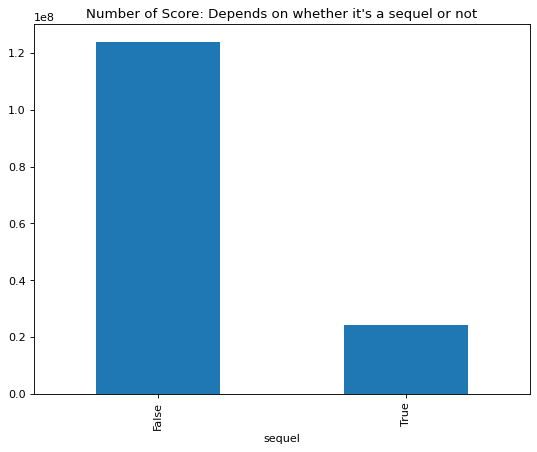

In [56]:
sequel_agg.plot(
    kind="bar", y="number_of_score", legend=False,
    title="Number of Score: Depends on whether it's a sequel or not"
)
plt.savefig(output_dir / "11_Number of Score Depends on whether it's a sequel or not.png")
plt.show()

評価の平均値のグラフ。こちらは平均値の方が若干上回っている。<br>
これは、続編を観ようとするのは、それだけその作品に好意的な印象を持っている人に限られるからであろう。

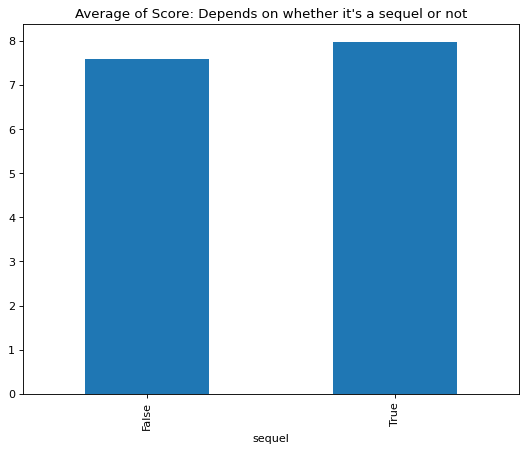

In [57]:
sequel_agg.plot(
    kind="bar", y="average_of_score", legend=False,
    title="Average of Score: Depends on whether it's a sequel or not"
)
plt.savefig(output_dir / "12_Average of Score Depends on whether it's a sequel or not.png")
plt.show()

### まとめ
- レビューサイトに投稿されたデータから人気タイトルを抽出しようとする場合、投稿された点数の**平均値**よりも、**投稿数**の方がより参考になる事が分かった。なぜなら、このデータの集め方では、評価の投稿自体が視聴者の任意であるため、評価を投稿するという行為自体が、その作品への関心を示していると言えるからである。
- 視聴者にとっては、TV放送形式で発表されるアニメが最も身近で、話題を呼ぶものである。
- エピソード数が飛び抜けて多い作品も見受けられたが、それはそのまま作品の評判に直結する事はない。要するに、**量より質**だと言えるだろう。